In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib.pyplot import figure

In [31]:
def visualize_prediction(confidence, first_f, last_f, no_features, name_time_column, dataframe, title, location_line, line=False):
    fig, axes = plt.subplots(2, 2, figsize=(15,15), dpi=200)
    ax = axes.ravel()
    columns = dataframe.columns
    plt.subplots_adjust(hspace=0.6, wspace=0.4)
    for i in range(first_f,last_f):
        sns.scatterplot(data=dataframe, 
                        x=name_time_column, 
                        y=columns[i], 
                        ax=ax[i-first_f], 
                        label="target", 
                        palette="Greys")
        sns.lineplot(data=dataframe, 
                     x=name_time_column, 
                     y=columns[i+no_features], 
                     ax=ax[i-first_f], 
                     label="predicted", 
                     palette="Blues")
        ax[i-first_f].fill_between(dataframe[i+no_features].values - confidence * dataframe[i+2*no_features].values, 
                              dataframe[i+no_features].values + confidence * dataframe[i+2*no_features].values, 
                              alpha=0.2, 
                              color='blue')
        if line:
            ax[i-first_f].axvline(location_line, 0,2, color="r", linestyle ="--", linewidth=1, label="train-validation")
        ax[i-first_f].set(xlabel='up time', ylabel='sensor value')
        ax[i-first_f].set(title=columns[i])
        plt.setp(ax[i-first_f].get_xticklabels(), rotation=45) 
    fig.suptitle(title)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [60]:
def visualise_mle_prediction(dataframe, no_features, first_feature, last_feature):
    fig, axes = plt.subplots(no_features, 1, figsize=(30,40))
    ax = axes.ravel()
    columns = dataframe.columns
    t = artifical_data.iloc[:,0]
    for i in range(first_feature, last_feature):
        # Values for drawing lower and upper bound
        target = dataframe.iloc[:,i].values
        mu = dataframe.iloc[:,i+no_features].values
        sigma = dataframe.iloc[:,i+2*no_features].values
        lower_bound = mu - 2*sigma
        upper_bound = mu + 2* sigma
        
        # Values about appearance of anomaly 
        palette = []
        anomaly_label = dataframe.iloc[:, i+4*no_features+1].values
        if 0 in anomaly_label and 1 not in anomaly_label:
            palette = ["blue"]
        elif 1 in anomaly_label and 0 not in anomaly_label:
            palette = ["red"]
        elif 0 in anomaly_label and 1 in anomaly_label:
            palette = ["blue","red"]

        sns.lineplot(data=dataframe, 
                     x=t, 
                     y=columns[i+no_features], 
                     ax=ax[i-first_feature], 
                     color="black")
        ax[i-first_feature].fill_between(t, lower_bound, upper_bound, color="grey", alpha=0.5)
        sns.scatterplot(data=dataframe, 
                        x=t, 
                        y=columns[i],
                        ax=ax[i-first_feature], 
                        hue=columns[i+4*no_features+1],
                        palette=palette
                        )   

# Visualisation of Prediction - Artifical Signal
## Phase 1 - no error (no error)

In [81]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[:50000,:]

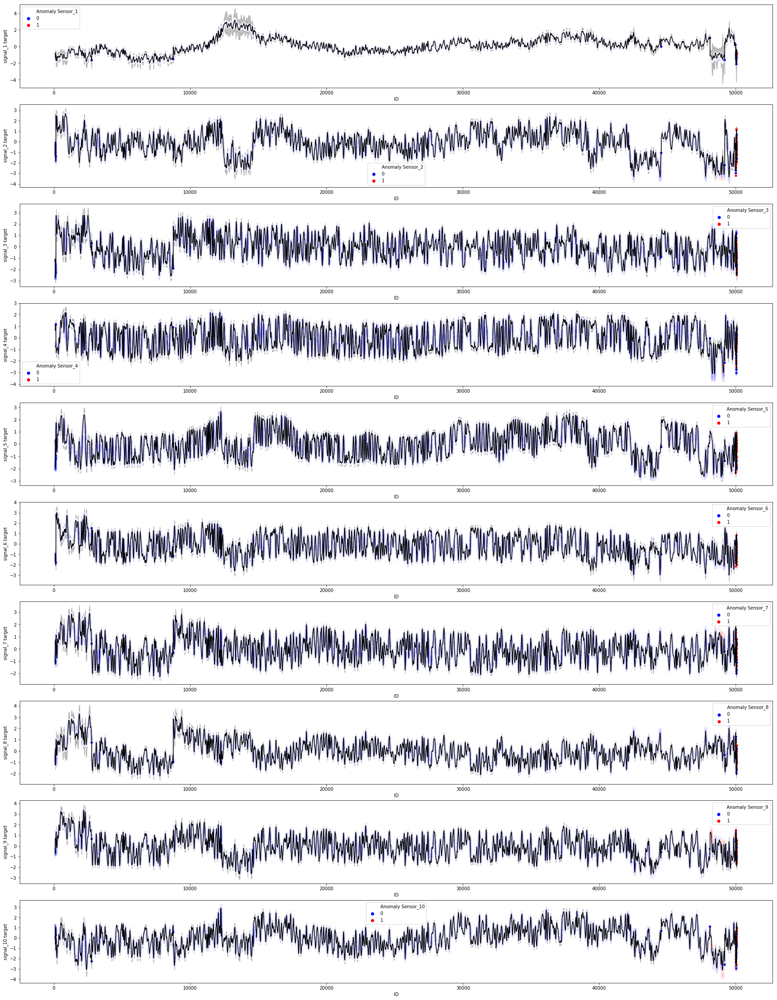

In [26]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11
                        )
plt.show()

## Detail View

In [61]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[0:500,:]

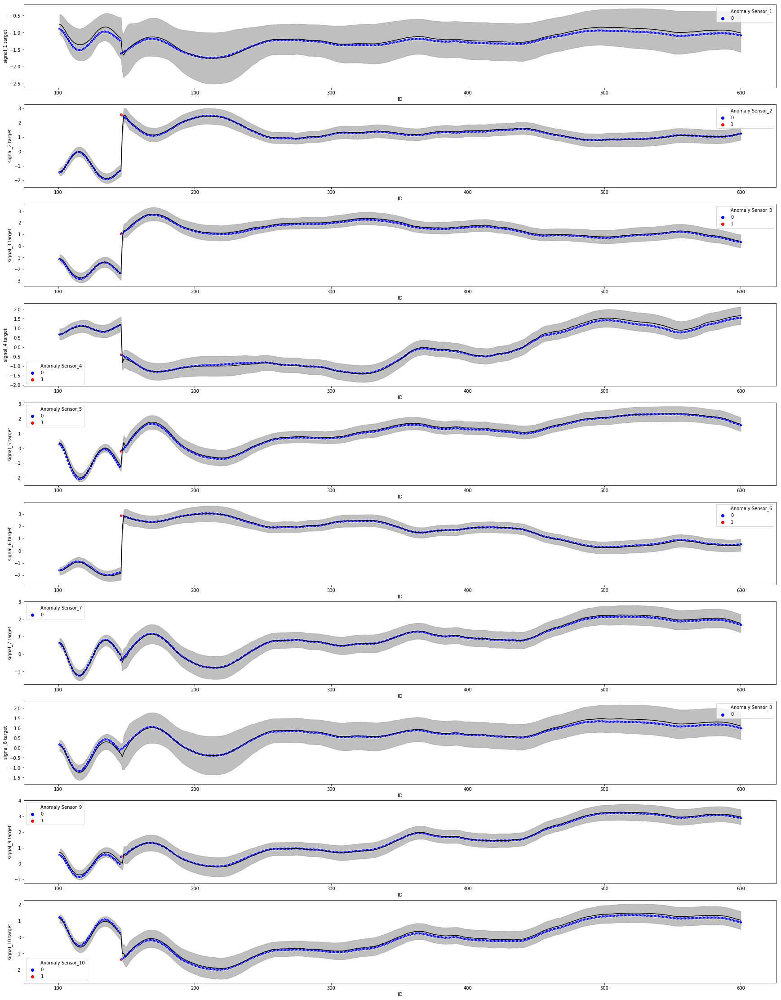

In [63]:
visualise_mle_prediction(dataframe = artifical_data,
                         no_features=10, 
                         first_feature=1, 
                         last_feature=11
                        )
plt.savefig("./no_eror.png")
plt.show()

## Phase 2 - degradation (small error)

In [64]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[50000:100000,:]

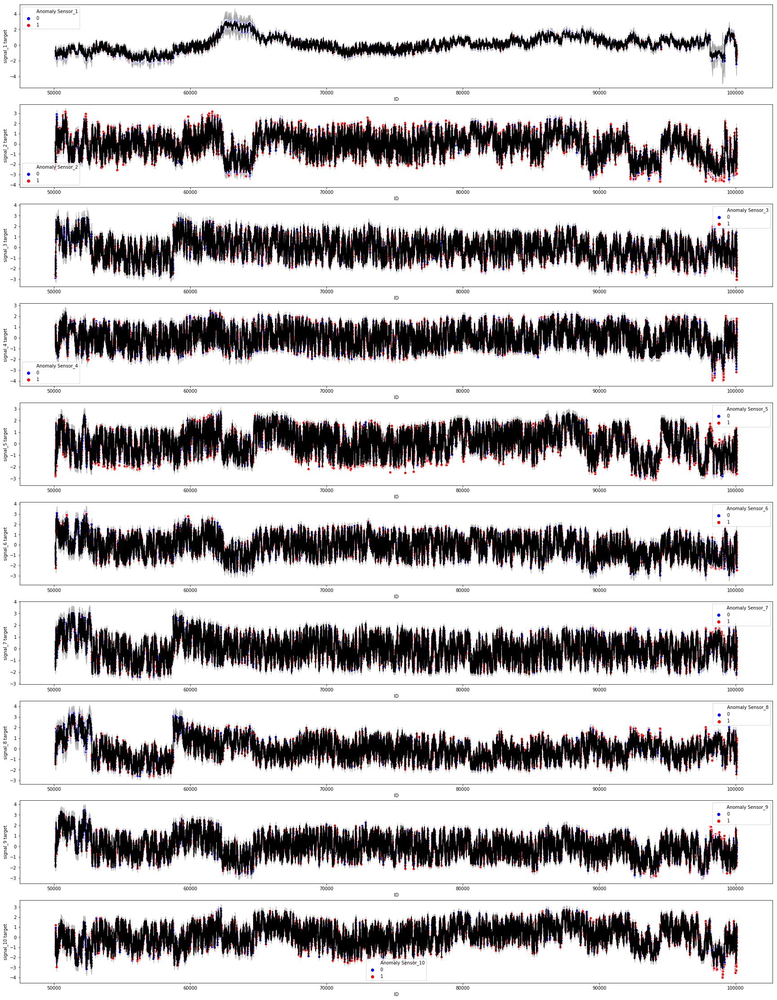

In [28]:
visualise_mle_prediction(no_features=10, 
                         dataframe = artifical_data,
                         first_feature=1, 
                         last_feature=11
                        )
plt.show()

## Detail View

In [71]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[50000:50500,:]

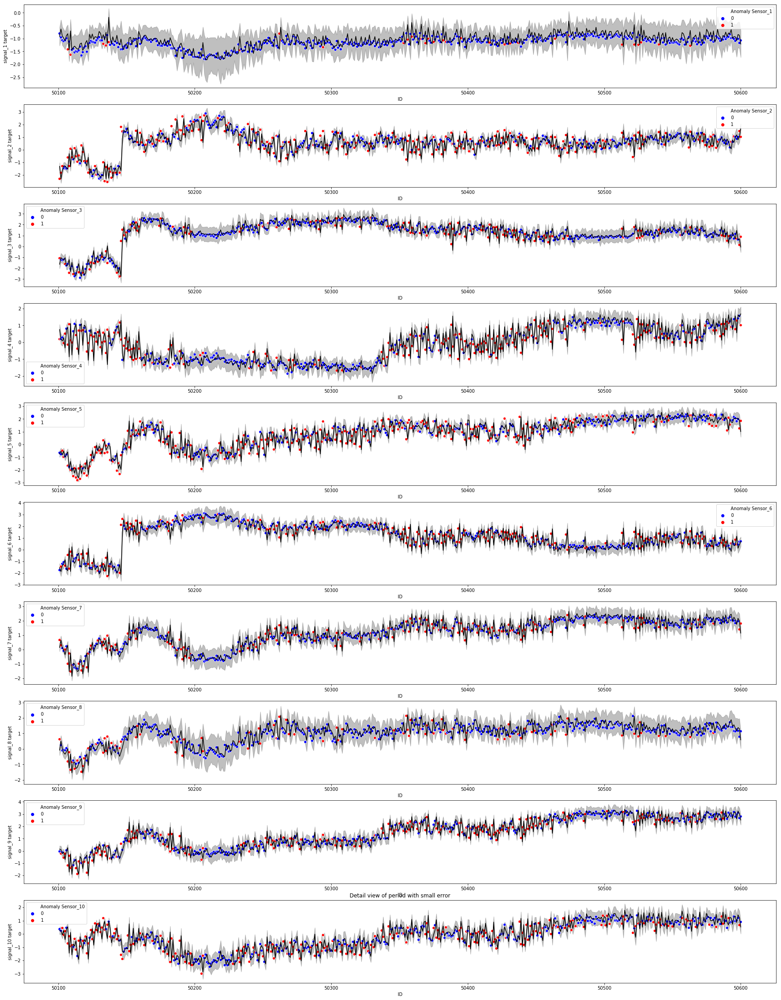

In [72]:
visualise_mle_prediction(no_features=10, 
                         dataframe = artifical_data,
                         first_feature=1, 
                         last_feature=11
                        )
plt.title("Detail view of period with small error")
plt.savefig("./small_error.png")
plt.show()

## Phase 3 - failure (large error)

In [31]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[100000:150000,:]

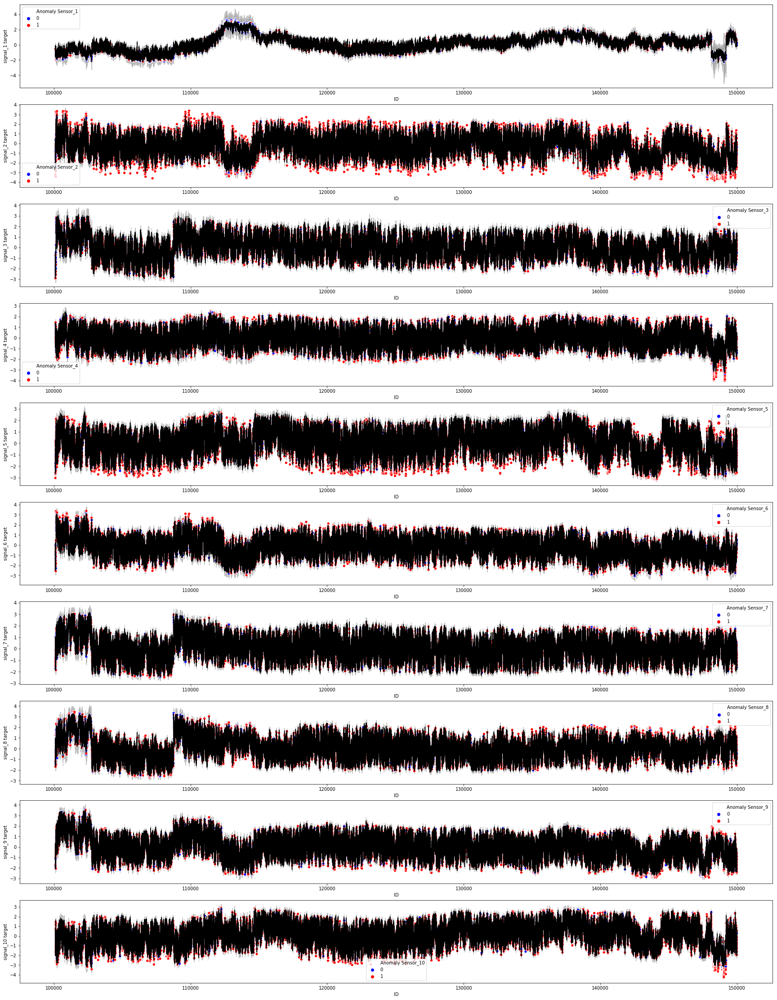

In [32]:
visualise_mle_prediction(no_features=10, 
                         dataframe = artifical_data,
                         first_feature=1, 
                         last_feature=11
                        )
plt.show()

## Detail View

In [69]:
artifical_data = pd.read_csv("../../files/prediction/MLE/cpps_data.csv", sep=";")
artifical_data = artifical_data.iloc[100000:100500,:]

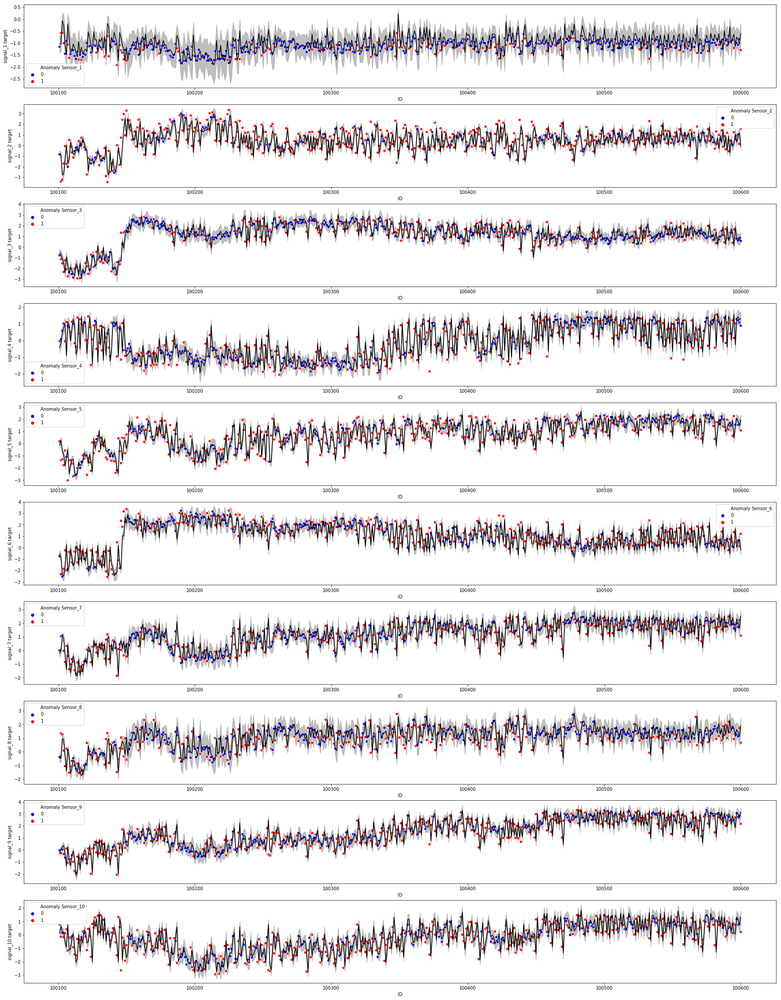

In [70]:
visualise_mle_prediction(no_features=10, 
                         dataframe = artifical_data,
                         first_feature=1, 
                         last_feature=11
                        )
("Detail view of period with large error")
plt.savefig("./large_error.png")
plt.show()